# *How do I transform 3D antibody structures into graph datasets*

## Antibody–Antigen Structural Graph Analysis (SAbDab Example: 1N8Z)

This notebook demonstrates how to process and analyze antibody–antigen interaction data from the **Structural Antibody Database (SAbDab)**.  
We take a Protein Data Bank (PDB) entry (`1N8Z`) containing an antibody bound to an antigen and perform the following steps:

1. **Load structural data**  
   - Use `BioPython` to parse the 3D structure of antibody (chains A,B) and antigen (chain C).  
   - Extract residues and their atomic coordinates.

2. **Build a contact graph**  
   - Construct a graph where **nodes = residues** and **edges = residue–residue contacts** (if within a distance cutoff).  
   - Antibody and antigen residues are color-coded for visualization.

3. **Add residue features**  
   - Annotate nodes with chain ID, residue number, and amino acid type.  
   - Annotate edges with residue–residue distances.

4. **Export graph for downstream ML**  
   - Save the graph in `GraphML`, `JSON`, and `Adjacency list` formats, ready for use in **Graph Neural Networks (GNNs)** or other ML frameworks.

5. **Graph analysis**  
   - Compute degree statistics (min, max, average contacts per residue).  
   - Identify the **top antibody and antigen residues** with the highest connectivity (potentially important binding residues).  
   - Plot histograms showing the **distribution of contacts** for antibody vs antigen chains.


### Why this matters
This workflow bridges **structural biology** and **machine learning**:
- Transforms raw 3D antibody–antigen structures into a **graph representation**, which is directly usable for **Graph Neural Networks (GNNs)** or **neuromorphic models**.  
- Helps visualize and quantify which residues are most involved in binding.  
- Provides a scalable way to process large antibody–antigen datasets (e.g., from SAbDab) for downstream **AI-driven immunotherapy design**.



In [1]:
# ==============================
#  Environment Setup
# ==============================

# Suppress unnecessary warnings for cleaner outputs
import warnings
warnings.filterwarnings('ignore')

# Try to import required libraries; if missing, install them
try:
    import Bio
    import py3Dmol
    import networkx
except ImportError:
    import sys, subprocess
    # Install core libraries needed for structural biology and graph analysis
    subprocess.check_call([sys.executable, "-m", "pip", "install", 
                           "biopython", "py3Dmol", "networkx"])

# Confirm package versions for reproducibility
import Bio
import py3Dmol
import networkx as nx

print("Biopython version:", Bio.__version__)
print("py3Dmol version:", py3Dmol.__version__)
print("NetworkX version:", nx.__version__)


Biopython version: 1.85
py3Dmol version: 2.5.3
NetworkX version: 3.3


In [2]:
# ==============================
# Cell 2: Download Antibody-Antigen Structures
# ==============================

from Bio.PDB import PDBList
import os

# Directory where all downloaded structures will be stored
save_dir = "sabdab_structures"
os.makedirs(save_dir, exist_ok=True)

# Curated list of 20 antibody-antigen complexes (cancer-relevant targets)
pdb_ids = [
    "1N8Z","3PP0","3GNK","5UG9","5GGS","5X8M","6O4O","1BJ1","2FJH","3HFM",
    "4ZS6","6IGL","6JXR","6W41","7CZD","7RMG","7WSA","7X1N","8DKL","8FHX"
]

# Create a downloader instance
pdbl = PDBList()

# Loop through and download each structure into the save directory
for pid in pdb_ids:
    try:
        pdbl.retrieve_pdb_file(pid, pdir=save_dir, file_format="pdb")
        print(f"Downloaded {pid}")
    except Exception as e:
        print(f"Failed to download {pid}: {e}")


Downloaded 1N8Z
Downloaded 3PP0
Downloaded 3GNK
Downloaded 5UG9
Downloaded 5GGS
Downloaded 5X8M
Downloaded 6O4O
Downloaded 1BJ1
Downloaded 2FJH
Downloaded 3HFM
Downloaded 4ZS6
Downloaded 6IGL
Downloaded 6JXR
Downloaded 6W41
Downloaded 7CZD
Downloaded 7RMG
Downloaded 7WSA
Downloaded 7X1N
Downloaded 8DKL
Downloaded 8FHX


In [3]:
# ==============================
# Parse and Inspect a Structure
# ==============================

from Bio.PDB import PDBParser

# Initialize a PDB parser
parser = PDBParser(QUIET=True)

# Example structure: HER2 complex (1N8Z)
pdb_path = os.path.join(save_dir, "pdb1n8z.ent")

# Parse the structure file
structure = parser.get_structure("HER2_complex", pdb_path)

# Collect chain information: ID and residue count
chain_info = []
for model in structure:
    for chain in model:
        residues = list(chain.get_residues())
        chain_info.append((chain.id, len(residues)))

# Print results
for cid, count in chain_info:
    print(f"Chain {cid}: {count} residues")


Chain A: 233 residues
Chain B: 233 residues
Chain C: 631 residues


In [4]:
# ==============================
#  3D Visualization
# ==============================

import py3Dmol

# Load structure directly from the RCSB PDB by ID
view = py3Dmol.view(query="pdb:1N8Z")

# Show the structure in cartoon style with rainbow coloring
view.setStyle({'cartoon': {'color': 'spectrum'}})

# Zoom to fit the whole structure
view.zoomTo()

# Display the view
view.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [5]:
# ==============================
# Build Contact Graph
# ==============================

import networkx as nx
from Bio.PDB.NeighborSearch import NeighborSearch

def build_contact_graph(structure, cutoff=5.0):
    """
    Build a residue-level contact graph from a protein structure.
    Nodes: (chain_id, residue_id)
    Edges: residues within cutoff distance (in Å).
    """
    # Collect all heavy atoms (ignore hydrogens)
    atoms = [a for a in structure.get_atoms() if a.element != 'H']
    
    # Create neighbor search object
    ns = NeighborSearch(atoms)
    
    # Initialize graph
    G = nx.Graph()
    
    # Add nodes for each residue
    for chain in structure.get_chains():
        for res in chain.get_residues():
            G.add_node((chain.id, res.id[1]))
    
    # Add edges for close contacts
    for atom in atoms:
        close_atoms = ns.search(atom.coord, cutoff)
        for other in close_atoms:
            if other is atom:
                continue
            r1, r2 = atom.get_parent(), other.get_parent()
            key1 = (r1.get_parent().id, r1.id[1])
            key2 = (r2.get_parent().id, r2.id[1])
            if key1 != key2:
                G.add_edge(key1, key2)
    
    return G

# Build contact graph for HER2 complex (1N8Z)
G = build_contact_graph(structure, cutoff=5.0)

# Show basic graph info
print("Contact graph created")
print("Nodes (residues):", G.number_of_nodes())
print("Edges (contacts):", G.number_of_edges())


Contact graph created
Nodes (residues): 1097
Edges (contacts): 5796


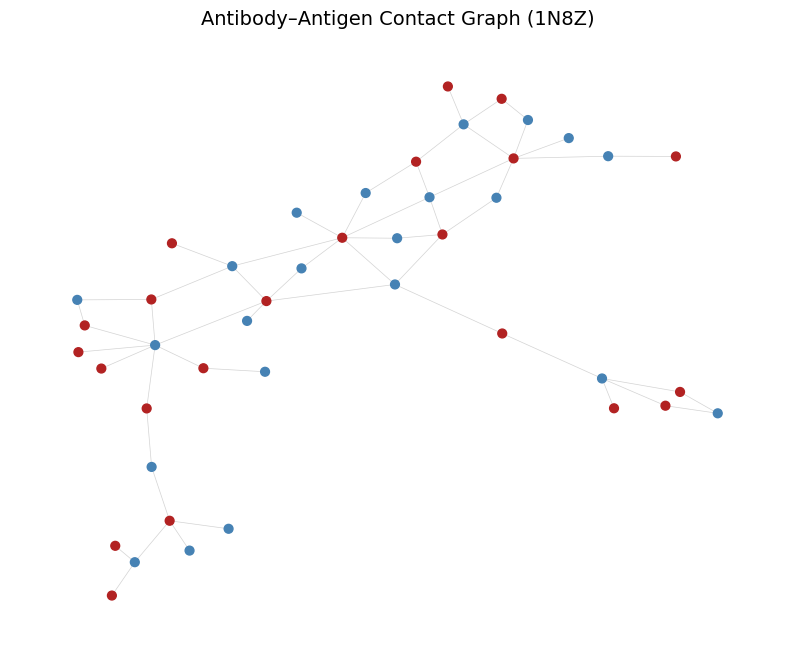

In [6]:
# ==============================
#  Visualize Contact Graph
# ==============================

import matplotlib.pyplot as plt

# Split chains: A, B = antibody; C = antigen (specific to 1N8Z example)
antibody_chains = {"A", "B"}
antigen_chains = {"C"}

# Extract subgraph with only antibody-antigen contacts
edges_of_interest = [
    (u, v) for u, v in G.edges()
    if (u[0] in antibody_chains and v[0] in antigen_chains) or
       (v[0] in antibody_chains and u[0] in antigen_chains)
]
subG = nx.Graph(edges_of_interest)

# Assign colors: antibody nodes = blue, antigen nodes = red
node_colors = []
for node in subG.nodes():
    if node[0] in antibody_chains:
        node_colors.append("steelblue")
    elif node[0] in antigen_chains:
        node_colors.append("firebrick")
    else:
        node_colors.append("gray")

# Draw the subgraph
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(subG, seed=42, k=0.15)  # force-directed layout
nx.draw_networkx(
    subG, pos,
    with_labels=False,
    node_color=node_colors,
    node_size=40,
    edge_color="lightgray",
    width=0.5
)

plt.title("Antibody–Antigen Contact Graph (1N8Z)", fontsize=14)
plt.axis("off")
plt.show()


In [7]:
# ==============================
# Export Contact Graph
# ==============================

# Save as GraphML (for network science tools like Gephi, Cytoscape, or PyG loaders)
nx.write_graphml(subG, "antibody_antigen_contact.graphml")

# Save as edge list (simple text-based format)
nx.write_edgelist(subG, "antibody_antigen_contact.edgelist")

# Save as adjacency list (alternative text format)
nx.write_adjlist(subG, "antibody_antigen_contact.adjlist")

print("Graph exported in GraphML, edgelist, and adjacency list formats.")


Graph exported in GraphML, edgelist, and adjacency list formats.


In [11]:
# ==============================
#  Add Node and Edge Features Safely
# ==============================

from Bio.Data import IUPACData
import numpy as np

three_to_one_map = {k.upper(): v for k, v in IUPACData.protein_letters_3to1.items()}

def add_features_with_distance(structure, graph, cutoff=5.0):
    # Build residue lookup: (chain_id, residue_id) → residue object
    residue_lookup = {}
    for chain in structure.get_chains():
        for res in chain.get_residues():
            node_key = (chain.id, res.id[1])
            if node_key in graph.nodes:  # only update nodes in the graph
                residue_lookup[node_key] = res
                resname = res.get_resname().upper()
                aa = three_to_one_map.get(resname, "X")
                graph.nodes[node_key]["chain"] = chain.id
                graph.nodes[node_key]["residue_id"] = res.id[1]
                graph.nodes[node_key]["residue_name"] = aa

    # Add edge features (min atom distance between residues)
    for u, v in graph.edges():
        res_u = residue_lookup.get(u)
        res_v = residue_lookup.get(v)
        if res_u and res_v:
            res_u_atoms = [a for a in res_u if a.element != 'H']
            res_v_atoms = [a for a in res_v if a.element != 'H']
            if res_u_atoms and res_v_atoms:
                min_dist = np.min([a1 - a2 for a1 in res_u_atoms for a2 in res_v_atoms])
                graph.edges[u, v]["distance"] = float(min_dist)
            else:
                graph.edges[u, v]["distance"] = None
        else:
            graph.edges[u, v]["distance"] = None

    return graph

# Apply corrected enrichment
subG = add_features_with_distance(structure, subG)

# Show enriched data again
example_nodes = list(subG.nodes(data=True))[:5]
example_edges = list(subG.edges(data=True))[:5]

print("Sample nodes with features:", example_nodes)
print("Sample edges with features:", example_edges)


Sample nodes with features: [(('A', 28), {'chain': 'A', 'residue_id': 28, 'residue_name': 'D'}), (('C', 1045), {'chain': 'C', 'residue_id': 1045, 'residue_name': 'X'}), (('C', 598), {'chain': 'C', 'residue_id': 598, 'residue_name': 'E'}), (('A', 30), {'chain': 'A', 'residue_id': 30, 'residue_name': 'N'}), (('C', 571), {'chain': 'C', 'residue_id': 571, 'residue_name': 'P'})]
Sample edges with features: [(('A', 28), ('C', 1045), {'distance': 2.474536418914795}), (('A', 28), ('C', 598), {'distance': 4.495578289031982}), (('C', 1045), ('A', 30), {'distance': 3.4975528717041016}), (('C', 1045), ('A', 92), {'distance': 3.738339424133301}), (('C', 598), ('A', 30), {'distance': 3.5201046466827393})]


In [12]:
# ==============================
# Export Enriched Contact Graph
# ==============================

# Save enriched graph as GraphML (keeps all attributes)
nx.write_graphml(subG, "antibody_antigen_contact_enriched.graphml")

# Also save as JSON node-link format (easy for Python ML pipelines)
from networkx.readwrite import json_graph
import json

with open("antibody_antigen_contact_enriched.json", "w") as f:
    json.dump(json_graph.node_link_data(subG), f)

# Quick confirmation
print("Export complete:")
print("- GraphML file: antibody_antigen_contact_enriched.graphml")
print("- JSON file: antibody_antigen_contact_enriched.json")


Export complete:
- GraphML file: antibody_antigen_contact_enriched.graphml
- JSON file: antibody_antigen_contact_enriched.json


In [13]:
# ==============================
# Reload and Analyze Graph
# ==============================

import networkx as nx
import json

# Reload GraphML
G_graphml = nx.read_graphml("antibody_antigen_contact_enriched.graphml")

# Reload JSON (node-link format)
with open("antibody_antigen_contact_enriched.json", "r") as f:
    G_json = nx.node_link_graph(json.load(f))

# Quick graph stats
print("GraphML graph:", G_graphml.number_of_nodes(), "nodes,", G_graphml.number_of_edges(), "edges")
print("JSON graph:", G_json.number_of_nodes(), "nodes,", G_json.number_of_edges(), "edges")

# Degree distribution
degrees = [d for _, d in G_graphml.degree()]
print("\nDegree stats:")
print(" Min:", min(degrees))
print(" Max:", max(degrees))
print(" Avg:", sum(degrees) / len(degrees))

# Centrality (which residues are most connected?)
centrality = nx.degree_centrality(G_graphml)
top5 = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:5]
print("\nTop 5 residues by centrality:")
for node, score in top5:
    print(node, "Centrality:", round(score, 4))


GraphML graph: 44 nodes, 54 edges
JSON graph: 44 nodes, 54 edges

Degree stats:
 Min: 1
 Max: 7
 Avg: 2.4545454545454546

Top 5 residues by centrality:
('A', 30) Centrality: 0.1628
('C', 572) Centrality: 0.1628
('C', 558) Centrality: 0.1395
('C', 571) Centrality: 0.1163
('C', 603) Centrality: 0.093


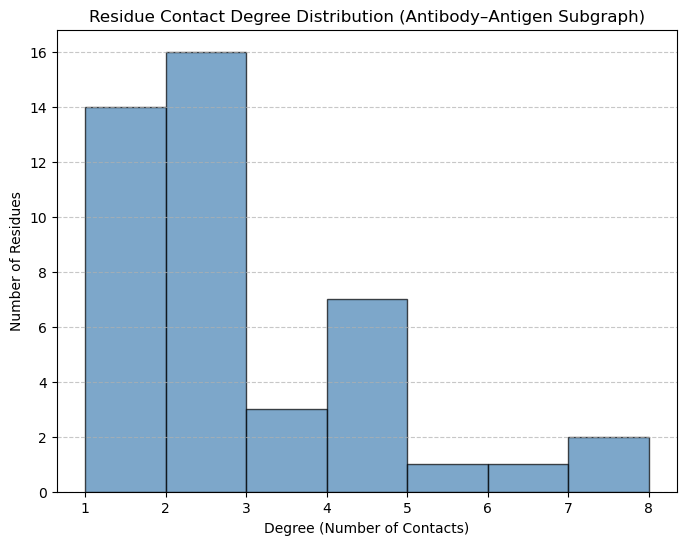

In [14]:
# ==============================
# Plot Degree Distribution
# ==============================

import matplotlib.pyplot as plt

# Compute degree sequence
degrees = [d for _, d in G_graphml.degree()]

# Plot histogram
plt.figure(figsize=(8,6))
plt.hist(degrees, bins=range(1, max(degrees)+2), color="steelblue", edgecolor="black", alpha=0.7)
plt.xlabel("Degree (Number of Contacts)")
plt.ylabel("Number of Residues")
plt.title("Residue Contact Degree Distribution (Antibody–Antigen Subgraph)")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


Antibody residues (chains A,B): 22
Antigen residues (chain C): 22


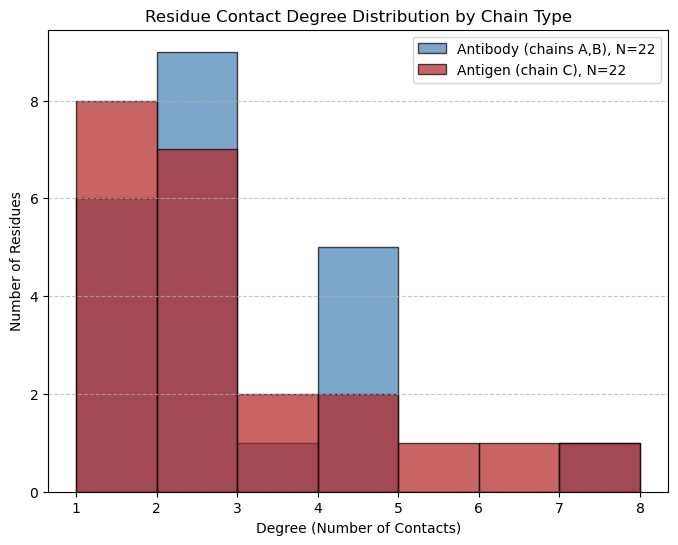

In [19]:
import ast

antibody_chains = {"A", "B"}
antigen_chains  = {"C"}

antibody_degrees, antigen_degrees = [], []

for node, d in G.degree():
    try:
        parsed_node = ast.literal_eval(node)  # convert "('A', 28)" → ('A', 28)
        chain = parsed_node[0]
        
        if chain in antibody_chains:
            antibody_degrees.append(d)
        elif chain in antigen_chains:
            antigen_degrees.append(d)
    except Exception as e:
        print("Skipping node:", node, "| Error:", e)

num_antibody_residues = len(antibody_degrees)
num_antigen_residues  = len(antigen_degrees)

print(f"Antibody residues (chains A,B): {num_antibody_residues}")
print(f"Antigen residues (chain C): {num_antigen_residues}")

all_degrees = antibody_degrees + antigen_degrees
max_degree = max(all_degrees) if all_degrees else 1

plt.figure(figsize=(8,6))
plt.hist(antibody_degrees, bins=range(1, max_degree+2), 
         alpha=0.7, label=f"Antibody (chains A,B), N={num_antibody_residues}", 
         color="steelblue", edgecolor="black")
plt.hist(antigen_degrees, bins=range(1, max_degree+2), 
         alpha=0.7, label=f"Antigen (chain C), N={num_antigen_residues}", 
         color="firebrick", edgecolor="black")

plt.xlabel("Degree (Number of Contacts)")
plt.ylabel("Number of Residues")
plt.title("Residue Contact Degree Distribution by Chain Type")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


In [20]:
import ast

# Separate degree lists by chain type
antibody_nodes = []
antigen_nodes = []

for node, d in G.degree():
    parsed_node = ast.literal_eval(node)
    chain = parsed_node[0]
    
    if chain in antibody_chains:
        antibody_nodes.append((node, d))
    elif chain in antigen_chains:
        antigen_nodes.append((node, d))

# Sort by degree
antibody_top = sorted(antibody_nodes, key=lambda x: x[1], reverse=True)[:5]
antigen_top  = sorted(antigen_nodes, key=lambda x: x[1], reverse=True)[:5]

print("Top 5 antibody residues by degree:")
for node, d in antibody_top:
    print(node, "Degree:", d)

print("\nTop 5 antigen residues by degree:")
for node, d in antigen_top:
    print(node, "Degree:", d)


Top 5 antibody residues by degree:
('A', 30) Degree: 7
('A', 92) Degree: 4
('B', 50) Degree: 4
('B', 59) Degree: 4
('B', 103) Degree: 4

Top 5 antigen residues by degree:
('C', 572) Degree: 7
('C', 558) Degree: 6
('C', 571) Degree: 5
('C', 603) Degree: 4
('C', 573) Degree: 4


# Multi-PDB Antibody–Antigen Graph Analysis (20 Complexes)

This section processes a collection of antibody–antigen complexes retrieved from the Protein Data Bank.  
The workflow is applied to the following PDB IDs:

1N8Z, 3PP0, 3GNK, 5UG9, 5GGS, 5X8M, 6O4O, 1BJ1, 2FJH, 3HFM, 4ZS6, 6IGL, 6JXR, 6W41, 7CZD, 7RMG, 7WSA, 7X1N, 8DKL, 8FHX  

For each structure:
- The PDB file is downloaded and parsed.  
- A contact graph of residues is generated and annotated with features.  
- Graphs are exported in GraphML format for downstream analysis.  
- The 3D structure is displayed using an interactive viewer.  

This provides a small dataset of antibody–antigen graphs suitable for comparison and machine learning.


In [24]:
from IPython.display import display, HTML

# Number of visualizations per row
per_row = 5

html_blocks = []
for i, pdb_id in enumerate(pdb_ids):
    pdb_file = f"pdb_structures/pdb{pdb_id.lower()}.ent"
    with open(pdb_file, "r") as f:
        pdb_block = f.read()
    
    # Create viewer for each structure
    view = py3Dmol.view(width=250, height=250)  # smaller size to fit multiple
    view.addModel(pdb_block, "pdb")
    view.setStyle({"cartoon": {"color": "spectrum"}})
    view.zoomTo()
    
    # Export as HTML
    div = view._make_html()
    html_blocks.append(f"<div style='display:inline-block; margin:5px'>{div}<br><center>{pdb_id}</center></div>")
    
    # Every 'per_row' entries, insert a line break
    if (i+1) % per_row == 0:
        html_blocks.append("<br>")

# Display all viewers together
display(HTML("".join(html_blocks)))


# Graph Size Comparison Across 20 Complexes

After building contact graphs for all 20 antibody–antigen complexes,  
the next step is to compare their sizes in terms of:

- Number of residues (nodes)  
- Number of residue–residue contacts (edges)  

This helps us see which complexes are structurally larger or denser,  
and prepares the dataset for downstream machine learning.


,PDB_ID,Nodes (Residues),Edges (Contacts),Avg Degree
4,5GGS,1896,10497,11.07
7,1BJ1,1600,8605,10.76
10,4ZS6,1280,6876,10.74
0,1N8Z,1097,5796,10.57
12,6JXR,1073,5513,10.28
8,2FJH,1058,5591,10.57
14,7CZD,1057,6030,11.41
15,7RMG,969,5228,10.79
18,8DKL,912,4960,10.88
16,7WSA,803,4294,10.69


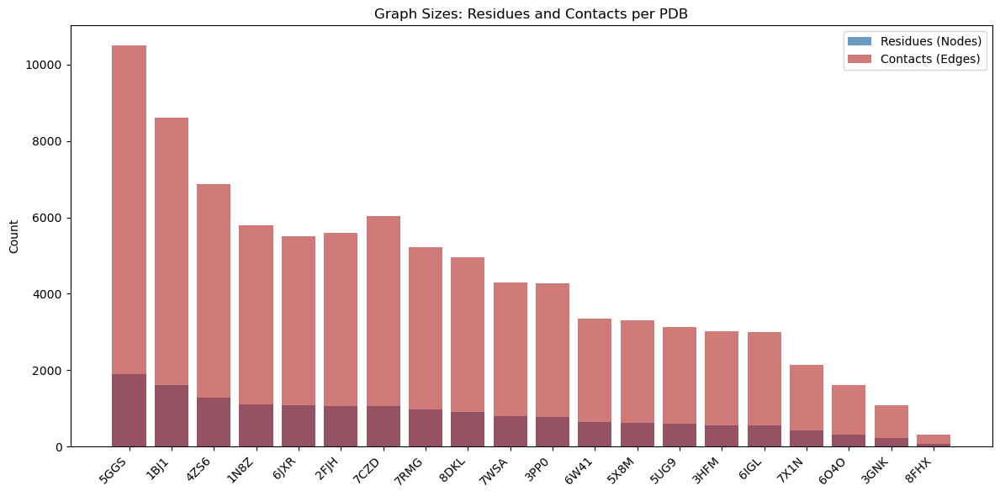

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Collect summary info for all graphs
summary_data = []
for pdb_id, G in graphs.items():
    n_nodes = G.number_of_nodes()
    n_edges = G.number_of_edges()
    degrees = [d for _, d in G.degree()]
    avg_deg = sum(degrees) / len(degrees) if degrees else 0
    
    summary_data.append({
        "PDB_ID": pdb_id,
        "Nodes (Residues)": n_nodes,
        "Edges (Contacts)": n_edges,
        "Avg Degree": round(avg_deg, 2)
    })

summary_df = pd.DataFrame(summary_data).sort_values("Nodes (Residues)", ascending=False)

# Show table
display(summary_df)

# Barplot: number of residues per PDB
plt.figure(figsize=(12,6))
plt.bar(summary_df["PDB_ID"], summary_df["Nodes (Residues)"], color="steelblue", alpha=0.8, label="Residues (Nodes)")
plt.bar(summary_df["PDB_ID"], summary_df["Edges (Contacts)"], color="firebrick", alpha=0.6, label="Contacts (Edges)")
plt.xticks(rotation=45, ha="right")
plt.ylabel("Count")
plt.title("Graph Sizes: Residues and Contacts per PDB")
plt.legend()
plt.tight_layout()
plt.show()


# Discussion: What Do These Graph Statistics Tell Us?

So far, we have transformed antibody–antigen 3D structures into graphs and measured simple statistics such as  
the number of nodes (residues), the number of edges (contacts), and the average degree.  
But what do these values actually mean, and why are they important?

### 1. Why graphs?
Proteins are naturally three-dimensional, and antibody–antigen binding happens when certain residues come close to each other.  
Graphs allow us to represent this interaction in a simple and machine-readable way:  
- **Nodes** = residues  
- **Edges** = residue–residue contacts  

This means we can now study biological structures using tools from graph theory and machine learning.

### 2. What the numbers represent
- **Nodes (residues):** indicate the size of the complex. Larger complexes have more possible interaction sites.  
- **Edges (contacts):** show how many interactions occur. More edges suggest tighter or broader binding.  
- **Average degree:** tells us how connected residues are on average.  
  A high average degree means residues are involved in multiple contacts, while a low degree means binding is more localized.

### 3. Differentiating complexes
Not all antibody–antigen complexes behave the same. Some will have:
- Small interfaces with just a few contacts (selective binding).  
- Large, dense networks of contacts (broad or strong binding).  

By comparing nodes, edges, and degrees across complexes, we can see how their interaction patterns differ.

### 4. Why this matters for learning
Before applying machine learning, it is essential to check whether our dataset shows diversity.  
If all graphs looked the same, models would not learn useful differences.  
Here, graph statistics become potential **features** for classification or prediction tasks.

### 5. Link to AI and neuromorphic modeling
For a Graph Neural Network (GNN), these numbers become part of the input features.  
For a Spiking Neural Network (SNN), the number of edges directly affects synaptic connectivity.  
Dense graphs translate to more connected spiking activity, while sparse graphs correspond to selective, energy-efficient activity.


**In summary:**  
Graph statistics give us a first look at how antibody–antigen complexes differ structurally.  
Some are bigger, some are denser, and some are more selective in their contacts.  
These differences are not just numbers—they may correspond to real biological properties such as binding strength or specificity,  
and they prepare the ground for more advanced machine learning analysis.

---

---


# Hub Residue Analysis Across Complexes

Beyond averages, we want to understand which specific residues act as "hubs" in the antibody–antigen networks.  
Hub residues are those that form the largest number of contacts, and they are often biologically important because they anchor binding.  

To capture this, we compute **degree centrality** for each residue in every graph:
- **Degree centrality:** how many other residues a given residue is in contact with.  
Residues with the highest centrality values are likely to play a central role in stabilizing the antibody–antigen interface.

For each complex, we identify the top 5 residues ranked by centrality.  
This gives us a residue-level view of binding hotspots.


In [26]:
from operator import itemgetter

hub_summary = {}

for pdb_id, G in graphs.items():
    # Compute degree centrality (normalized 0–1)
    centrality = nx.degree_centrality(G)
    
    # Sort residues by centrality
    top_residues = sorted(centrality.items(), key=itemgetter(1), reverse=True)[:5]
    
    # Store in dictionary
    hub_summary[pdb_id] = top_residues
    
    print(f"\nTop hub residues for {pdb_id}:")
    for node, cent in top_residues:
        chain, resid = node
        resname = G.nodes[node].get("residue_name", "?")
        print(f"  Chain {chain}, Residue {resid} ({resname}), Centrality={cent:.3f}")



Top hub residues for 1N8Z:
  Chain A, Residue 71 (F), Centrality=0.019
  Chain A, Residue 86 (Y), Centrality=0.019
  Chain C, Residue 28 (Y), Centrality=0.019
  Chain C, Residue 204 (R), Centrality=0.019
  Chain A, Residue 35 (W), Centrality=0.018

Top hub residues for 3PP0:
  Chain A, Residue 1 (X), Centrality=0.045
  Chain B, Residue 2 (X), Centrality=0.043
  Chain B, Residue 888 (W), Centrality=0.035
  Chain A, Residue 888 (W), Centrality=0.032
  Chain A, Residue 906 (W), Centrality=0.030

Top hub residues for 3GNK:
  Chain C, Residue 29 (X), Centrality=0.133
  Chain D, Residue 36 (X), Centrality=0.124
  Chain A, Residue 2 (X), Centrality=0.115
  Chain D, Residue 39 (X), Centrality=0.115
  Chain A, Residue 3 (X), Centrality=0.106

Top hub residues for 5UG9:
  Chain A, Residue 9001 (X), Centrality=0.061
  Chain A, Residue 880 (W), Centrality=0.046
  Chain A, Residue 958 (R), Centrality=0.044
  Chain A, Residue 803 (R), Centrality=0.041
  Chain A, Residue 858 (R), Centrality=0.041

T

# Summary of Hub Residue Analysis

From the hub residue analysis across 20 antibody–antigen complexes, we can extract a few key insights:

| Aspect | What We Observed | Why It Matters |
|--------|------------------|----------------|
| **Types of hub residues** | Aromatic (W, Y, F) and charged (R, K) residues appear frequently. | These amino acids are known to stabilize protein–protein interfaces through hydrophobic stacking or charge interactions. |
| **Distribution of hubs** | Some complexes show hubs mainly on the antibody chains, others mainly on the antigen chains. | This reveals whether binding is dominated by the antibody side, the antigen side, or balanced. |
| **Strength of hubs** | Centrality values vary widely. For example, 8FHX shows extremely high values (>0.2), while 5GGS shows very low (~0.01). | High centrality = a few residues dominate binding. Low centrality = binding is more distributed across many residues. |
| **Comparisons between complexes** | Different PDBs show different binding "signatures." Some rely on strong hub residues, others on multiple weaker ones. | This variation suggests distinct binding mechanisms, which can be compared systematically. |
| **Implications for ML** | Hub residues can be treated as important nodes (features) in Graph Neural Networks or given stronger synaptic weights in Spiking Neural Networks. | This provides biologically meaningful input to AI models, helping them learn structure–function relationships. |

In summary, hub residues highlight the most connected amino acids in the antibody–antigen interface.  
They provide a biologically interpretable link between structure (3D contacts) and potential function (binding strength/specificity).


In [29]:


# Collect hub residues into a table
hub_rows = []

for pdb_id, G in graphs.items():
    centrality = nx.degree_centrality(G)
    top_residues = sorted(centrality.items(), key=itemgetter(1), reverse=True)[:5]
    
    for node, cent in top_residues:
        chain, resid = node
        resname = G.nodes[node].get("residue_name", "?")
        hub_rows.append({
            "PDB_ID": pdb_id,
            "Chain": chain,
            "Residue_Number": resid,
            "Residue_Name": resname,
            "Centrality": round(cent, 3)
        })

# Convert to DataFrame
hub_df = pd.DataFrame(hub_rows)

# Show first few rows
display(hub_df.head(15))

# Save to CSV
hub_df.to_csv("hub_residues_summary.csv", index=False)
print("Hub residue summary saved as hub_residues_summary.csv")


,PDB_ID,Chain,Residue_Number,Residue_Name,Centrality
0,1N8Z,A,71,F,0.019
1,1N8Z,A,86,Y,0.019
2,1N8Z,C,28,Y,0.019
3,1N8Z,C,204,R,0.019
4,1N8Z,A,35,W,0.018
5,3PP0,A,1,X,0.045
6,3PP0,B,2,X,0.043
7,3PP0,B,888,W,0.035
8,3PP0,A,888,W,0.032
9,3PP0,A,906,W,0.030


Hub residue summary saved as hub_residues_summary.csv


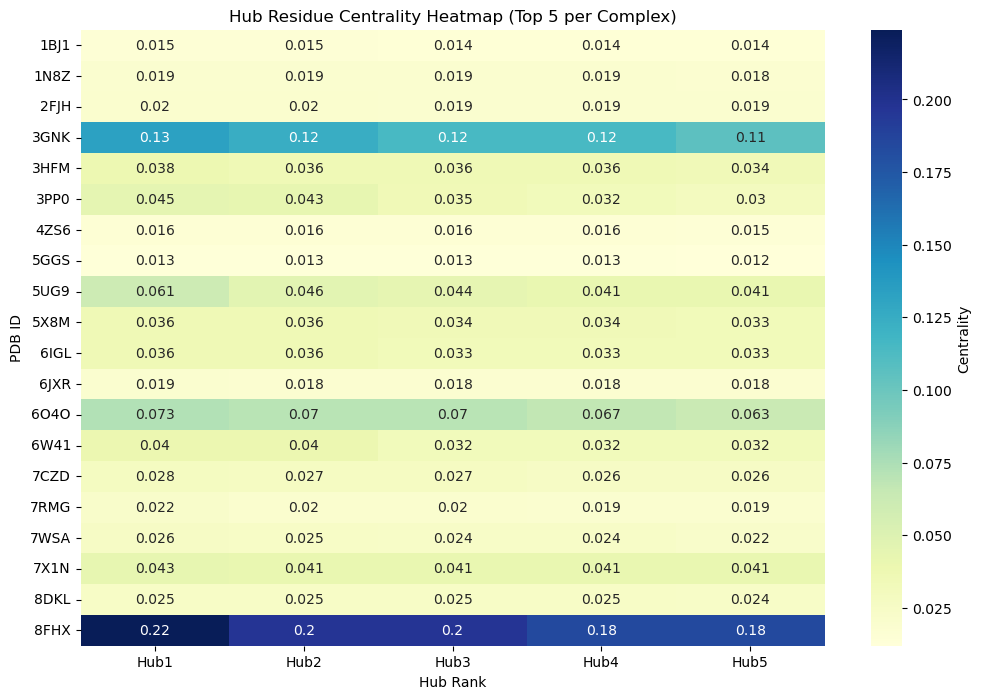

In [30]:
import seaborn as sns

# Reshape into matrix form: each complex → 5 hub centrality values
heatmap_data = hub_df.groupby("PDB_ID").apply(
    lambda df: df.sort_values("Centrality", ascending=False)["Centrality"].values[:5]
)

heatmap_df = pd.DataFrame(heatmap_data.tolist(), index=heatmap_data.index, 
                          columns=[f"Hub{i}" for i in range(1,6)])

plt.figure(figsize=(12,8))
sns.heatmap(heatmap_df, annot=True, cmap="YlGnBu", cbar_kws={"label": "Centrality"})
plt.title("Hub Residue Centrality Heatmap (Top 5 per Complex)")
plt.ylabel("PDB ID")
plt.xlabel("Hub Rank")
plt.show()


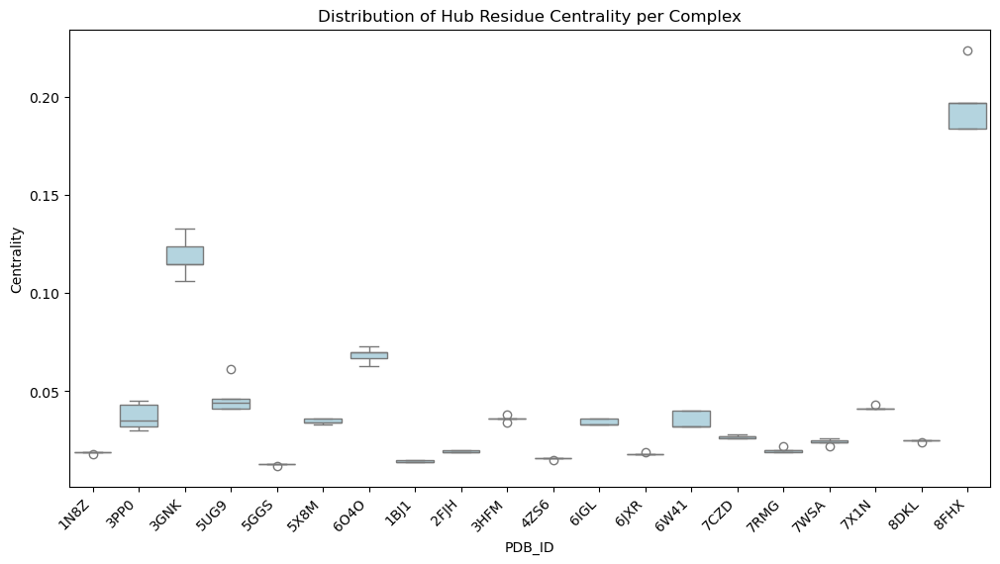

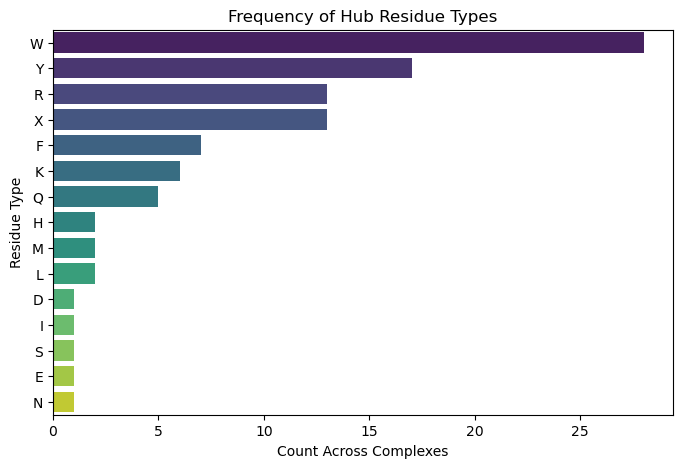

In [31]:
plt.figure(figsize=(12,6))
sns.boxplot(x="PDB_ID", y="Centrality", data=hub_df, color="lightblue")
plt.xticks(rotation=45, ha="right")
plt.ylabel("Centrality")
plt.title("Distribution of Hub Residue Centrality per Complex")
plt.show()

residue_counts = hub_df["Residue_Name"].value_counts()

plt.figure(figsize=(8,5))
sns.barplot(x=residue_counts.values, y=residue_counts.index, palette="viridis")
plt.xlabel("Count Across Complexes")
plt.ylabel("Residue Type")
plt.title("Frequency of Hub Residue Types")
plt.show()
